In [2]:
from plotter_utils import *

# globals
model_name = 'gpt-3.5-turbo-0613'
cpd_dataset_folder = 'datasets/cpd_debates'
cpd_raw_debates_folder = f'{cpd_dataset_folder}/cpd_debates_raw'
cpd_slices_folder = f'{cpd_dataset_folder}/cpd_debates_slices'
cpd_slices_texts_folder = f'{cpd_dataset_folder}/cpd_debates_slices_text'
cpd_measurements_folder = f'{cpd_dataset_folder}/cpd_debates_measurements'
plots_folder = 'plots'

report_latex_folder = 'report/sec/code_info/'

debates_d, slices_d, paragraphs_d = load_dataset()

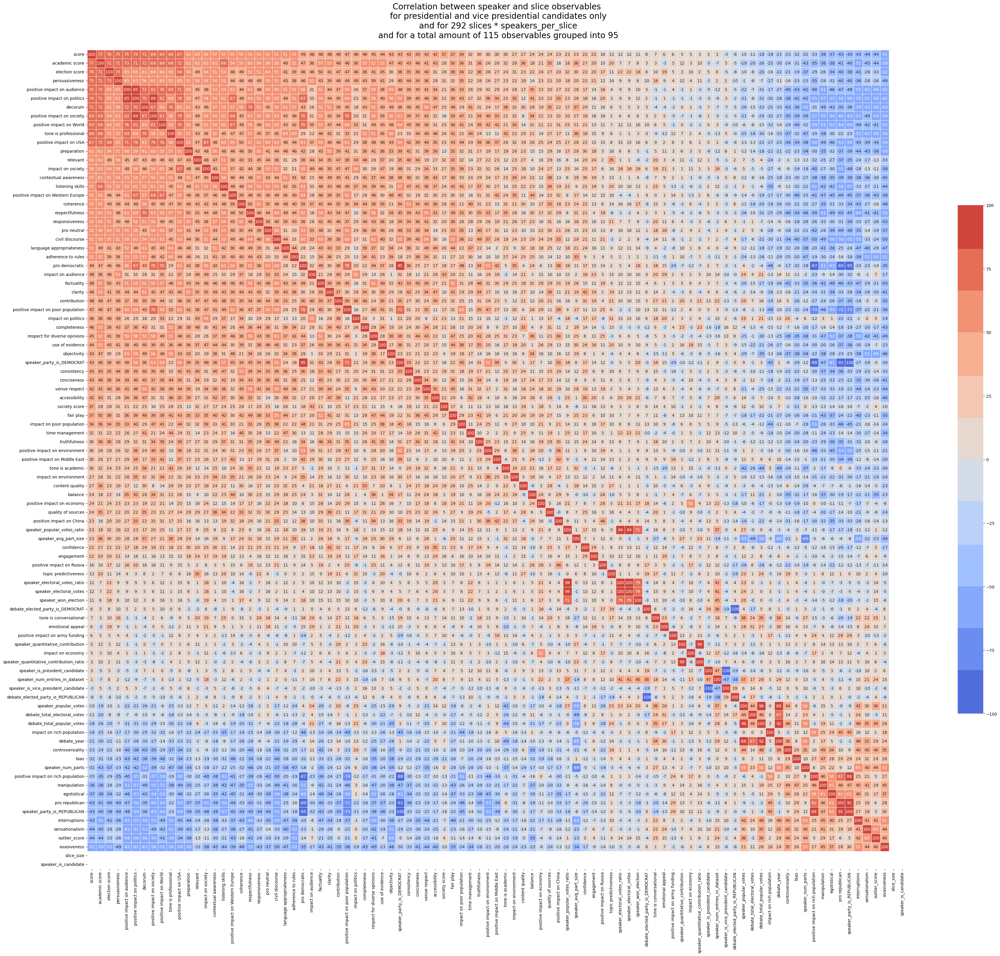

In [3]:
slice_speaker_base_observables = load_slice_and_measured_observables(slices_d)
speaker_measurements = load_speaker_measurements()

SS_SSO = speaker_measurements['WS_SS_SSO_measurements']

SS_SSO_grouped_df, n_raw_observables, n_grouped_observables = prepare_speaker_observables(slice_speaker_base_observables, SS_SSO)

SS_SSO_grouped_candidates_only_df = SS_SSO_grouped_df[SS_SSO_grouped_df['speaker_party_is_UNKNOWN'] == 0]
SS_SSO_grouped_candidates_only_df = SS_SSO_grouped_candidates_only_df.drop(columns=['speaker_party_is_UNKNOWN'])

# heatmap of correlations
corr = SS_SSO_grouped_candidates_only_df.select_dtypes(exclude=['object']).corr()
corr = corr.sort_values(by=['score'], ascending=False)
corr = corr.sort_values(by=['score'], axis=1, ascending=False)

f, ax = plt.subplots(figsize=(45, 45))
# create color map between -1 and 1 for heatmap that is dark blue for -1, light blue for -0.5, white for 0, light red for 0.5, dark red for 1
# create color map where the gradient changes faster if there are more values in a bin
cmap = sns.color_palette("coolwarm", 12)

SS_SSO_corr = corr
# annotate with values * 100 as integers
sns.heatmap(corr*100, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.0f')

plt.title(f'Correlation between speaker and slice observables\n \
for presidential and vice presidential candidates only\n \
and for {len(SS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
plt.show()

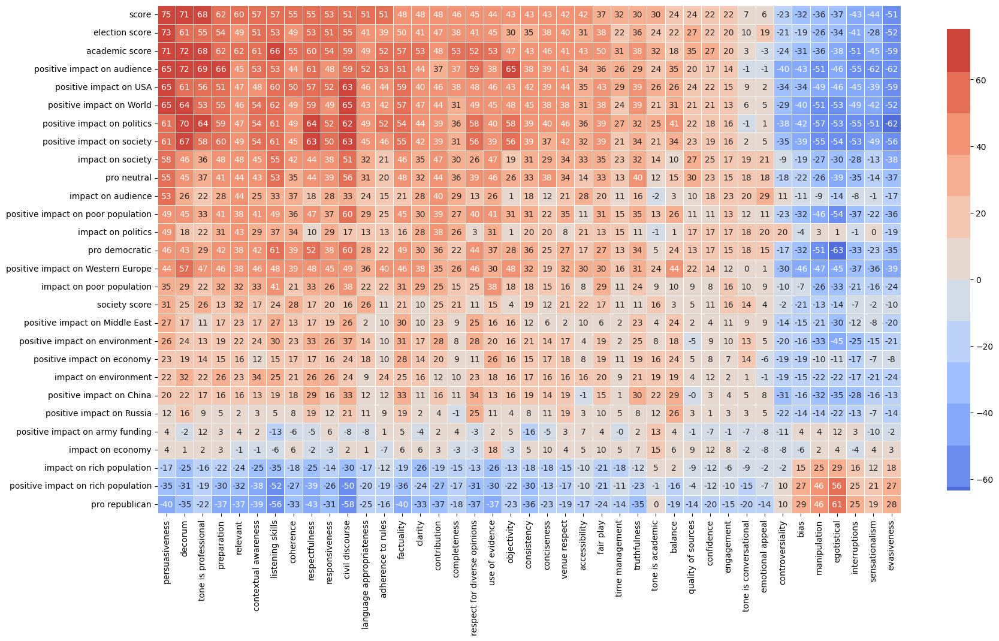

In [3]:
# heatmap of correlations
corr_result_pred = corr.copy()
# make rows only contain observables in result_observables
corr_result_pred = corr_result_pred.loc[corr_result_pred.index.isin(set([o.name for o in result_observables.values()]))] 
# make columns only contain observables in predictor_observables
corr_result_pred = corr_result_pred[corr_result_pred.columns.intersection(set([o.name for o in predictor_observables.values()]))]

corr_result_pred = corr_result_pred.sort_values(by=['score'], axis=1, ascending=False)
# sort by values in first column
corr_result_pred = corr_result_pred.sort_values(by=[corr_result_pred.columns[0]], ascending=False)

f, ax = plt.subplots(figsize=(20, 20))
cmap = sns.color_palette("coolwarm", 12)

sns.heatmap(corr_result_pred*100, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.0f')

# plt.title(f'Correlation between speaker and slice observables\n \
# for presidential and vice presidential candidates only\n \
# and for {len(SS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
# and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
plt.show()

/home/david/Documents/LLM-Political-Study/.env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/david/Documents/LLM-Political-Study/.env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/david/Documents/LLM-Political-Study/.env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/david/Documents/LLM-Political-Study/.env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_d

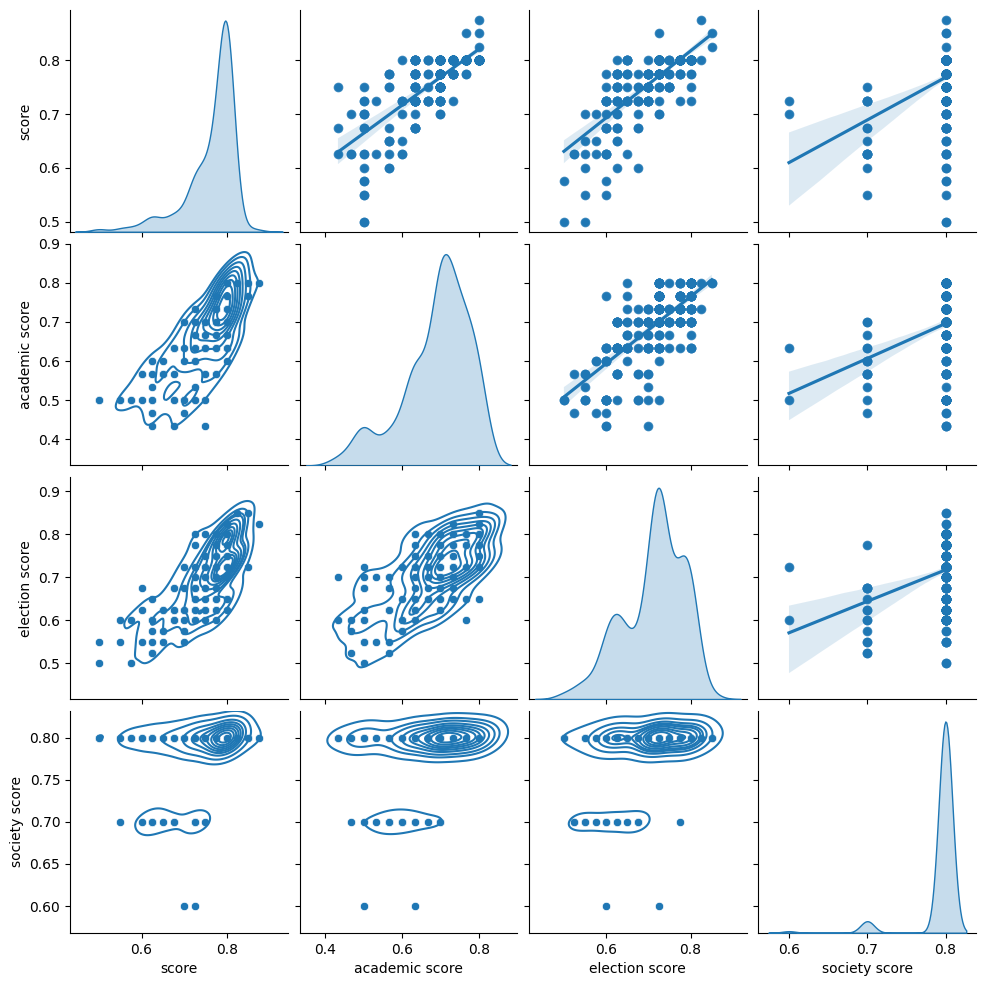

In [5]:
# pairplot with all values that contain score in name
scores = list(set([o.name for o in result_observables.values() if 'score' in o.name]))

g = sns.pairplot(SS_SSO_grouped_candidates_only_df, vars=scores, diag_kind='kde')
# g.map_upper(sns.scatterplot)
g.map_upper(sns.regplot)
g.map_lower(sns.kdeplot)
# g.map_diag(sns.kdeplot, lw=3, legend=False)

/home/david/Documents/LLM-Political-Study/.env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/david/Documents/LLM-Political-Study/.env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/david/Documents/LLM-Political-Study/.env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/david/Documents/LLM-Political-Study/.env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_d

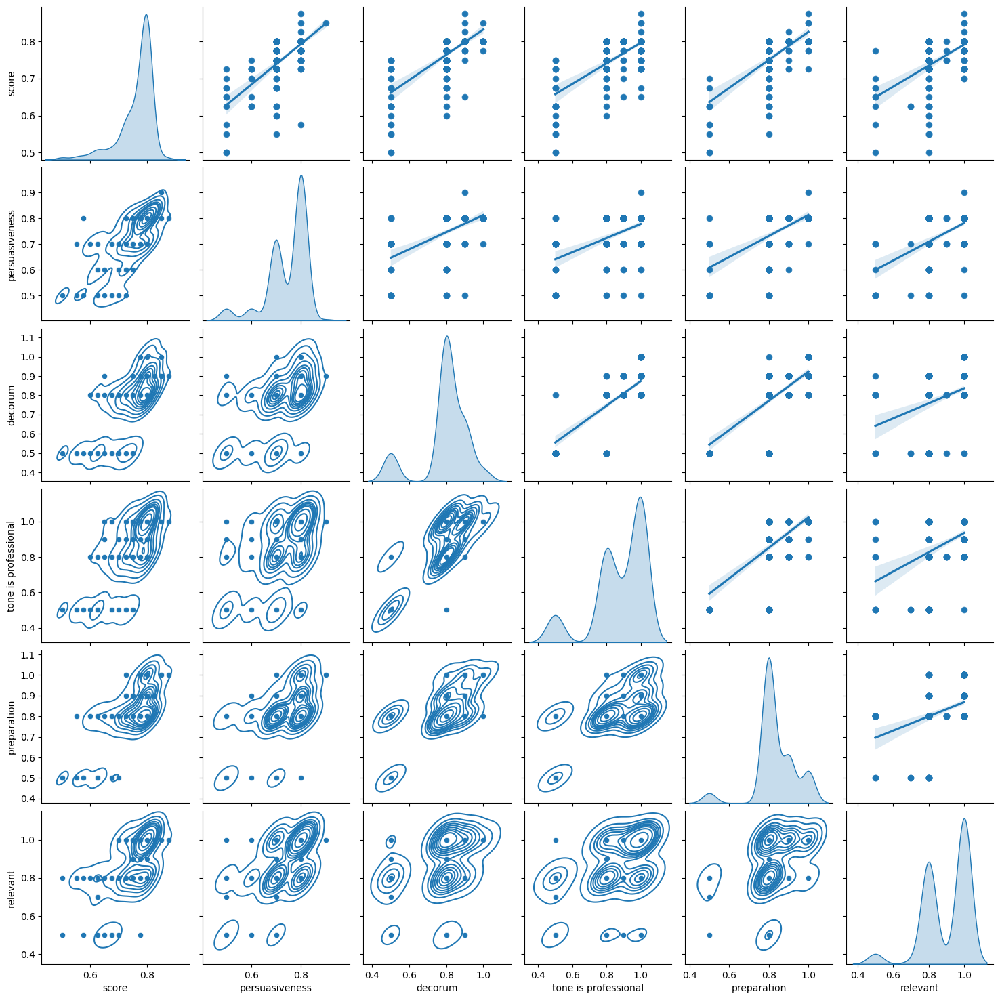

In [5]:
# pairplot of top 5 correlations vs all result
top_5_corr = ['score']
for i in range(5):
    top_5_corr.append(corr_result_pred.columns[i])

g = sns.pairplot(SS_SSO_grouped_candidates_only_df, vars=top_5_corr, diag_kind='kde')
# g.map_upper(sns.scatterplot)
g.map_upper(sns.regplot)
g.map_lower(sns.kdeplot)
# g.map_diag(sns.kdeplot, lw=3, legend=False)

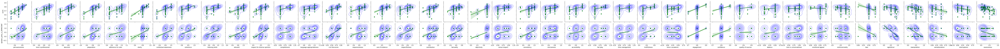

In [8]:
# pairplot of top 5 correlations vs all result
top_5_corr = corr_result_pred.columns
rows = ['score', 'speaker_party_is_DEMOCRAT']

g = sns.pairplot(SS_SSO_grouped_candidates_only_df, x_vars=top_5_corr, y_vars=rows, diag_kind='kde')
# g.map_upper(sns.scatterplot)
# g.map_upper(sns.regplot)
# g.map_lower(sns.kdeplot)
g.map(sns.regplot, color='green')
g.map(sns.kdeplot, color='blue', alpha=0.5)
# g.map_diag(sns.kdeplot, lw=3, legend=False)

In [9]:
df = SS_SSO_grouped_candidates_only_df.copy()

corr = df.corr()
corr.dropna(axis=0, how='all', inplace=True)
corr.dropna(axis=1, how='all', inplace=True)

# compute variance inflation factor
# https://www.statsmodels.org/stable/generated/statsmodels.stats.outliers_influence.variance_inflation_factor.html
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Add a constant "intercept" column to your dataframe because the statsmodels' VIF method expects it
# df['Intercept'] = 1

# # The independent variables set
# X = df[['Intercept', 'Feature1', 'Feature2', 'Feature3', ...]]  # include more features if required
X = df[corr.columns]
X['Intercept'] = 1

print(corr.columns)
print(df['speaker_won_election'].unique())

# Compute and view VIF
vif = pd.DataFrame()
vif["variables"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# print(vif)
for row in vif.iterrows():
    print(row[1]['variables'], row[1]['VIF'])

# # estimate uniquness of an observable by normalizing sum of correlations with other observables
# df = SS_SSO_grouped_candidates_only_df.copy()
# corr = df.corr()
# corr.dropna(axis=0, how='all', inplace=True)
# corr.dropna(axis=1, how='all', inplace=True)

# corr = 1-corr.abs()

# # # normalize corr matrix rows
# # for row in corr.index:
# #     corr.loc[row] = corr.loc[row].abs()/corr.loc[row].abs().sum()

# vals = {}
# for col in corr.columns:
#     vals[col] = corr[col].sum()
# sum1 = sum(vals.values())
# for key in vals.keys():
#     vals[key] = vals[key]/sum1

# df2 = SS_SSO_grouped_candidates_only_df.copy()
# # add column that is equivalent to truthfulness
# for i in range(10):
#     df2[f'truthfulness_{i}'] = df2['truthfulness']
# # df2['truthfulness_2'] = df2['truthfulness']
# corr2 = df2.corr()
# corr2.dropna(axis=0, how='all', inplace=True)
# corr2.dropna(axis=1, how='all', inplace=True)
# corr2 = 1-corr2.abs()
# # for row in corr2.index:
# #     corr2.loc[row] = corr2.loc[row].abs()/corr2.loc[row].abs().sum()

# vals2 = {}
# for col in corr2.columns:
#     vals2[col] = corr2[col].sum()
# # normalize
# sum2 = sum(vals2.values())
# for key in vals2.keys():
#     vals2[key] = vals2[key]/sum2

# for key, val in sorted(vals2.items(), key=lambda item: item[1], reverse=True):
#     print(f'{key:<40}: {val:.4f} {vals.get(key, 0.0):.4f}')

# # normalize columns of dfs
# for col in vals.keys():
#     df[col] = (df[col] - df[col].mean())/df[col].std()
# for col in vals2.keys():
#     df2[col] = (df2[col] - df2[col].mean())/df2[col].std()

# for index, entry in df2.iterrows():
#     # get weighted sums
#     sum_1 = 0
#     sum_2 = 0
#     for key in vals2.keys():
#         sum_1 += entry[key]*vals2[key]
#         sum_2 += entry[key]*vals.get(key, 0)
#     print(sum_1, sum_2)

    
# # corr = corr.sort_values(by=['score'], ascending=False)
# # corr = corr.sort_values(by=['score'], axis=1, ascending=False)
# # # mask = np.triu(np.ones_like(corr, dtype=bool))
# # f, ax = plt.subplots(figsize=(45, 45))
# # # create color map between -1 and 1 for heatmap that is dark blue for -1, light blue for -0.5, white for 0, light red for 0.5, dark red for 1
# # # create color map where the gradient changes faster if there are more values in a bin
# # cmap = sns.color_palette("coolwarm", 12)

# # SS_SSO_corr = corr
# # sns.heatmap(corr, cmap=cmap, center=0,
# #             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)


# # uniqueness = {}
# # obs_sum = {}
# # for observable in corr.columns:
# #     corr_sum = corr[observable].abs().sum()
# #     obs_sum[observable] = corr_sum
# # for observable in corr.columns:
# #     for observable2 in corr.columns:
# #         if observable != observable2:
# #             uniqueness[observable] = abs(corr[observable][observable2])/obs_sum[observable2]
# # # tot_sum = sum(uniqueness.values())
# # # for key, val in uniqueness.items():
# # #     uniqueness[key] = val / tot_sum

# # # # get svd of correlation matrix
# # # from numpy import linalg as LA
# # # U, s, Vh = LA.svd(corr, full_matrices=False)
# # # # get first column of U
# # # for i, (key, val) in enumerate(uniqueness.items()):
# # #     uniqueness[key] = (uniqueness[key], U[i][0])

# # for key, val in sorted(uniqueness.items(), key=lambda item: item[1], reverse=True):
# #     print(f'{key:<40}: {val:.3f}')

Index(['debate_total_electoral_votes', 'debate_total_popular_votes',
       'debate_year', 'speaker_quantitative_contribution',
       'speaker_quantitative_contribution_ratio', 'speaker_num_parts',
       'speaker_avg_part_size', 'speaker_electoral_votes',
       'speaker_electoral_votes_ratio', 'speaker_popular_votes',
       'speaker_popular_votes_ratio', 'speaker_won_election',
       'speaker_is_president_candidate', 'speaker_is_vice_president_candidate',
       'speaker_num_entries_in_dataset', 'outlier_score', 'egotistical',
       'persuasiveness', 'clarity', 'contribution', 'truthfulness', 'bias',
       'manipulation', 'evasiveness', 'relevant', 'conciseness',
       'use of evidence', 'emotional appeal', 'objectivity', 'sensationalism',
       'controversiality', 'coherence', 'consistency', 'factuality',
       'completeness', 'quality of sources', 'balance', 'tone is professional',
       'tone is conversational', 'tone is academic', 'accessibility',
       'engagement', 'a

/tmp/ipykernel_227465/3816559303.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Intercept'] = 1
/home/david/anaconda3/lib/python3.9/site-packages/statsmodels/stats/outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)
/home/david/anaconda3/lib/python3.9/site-packages/statsmodels/regression/linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


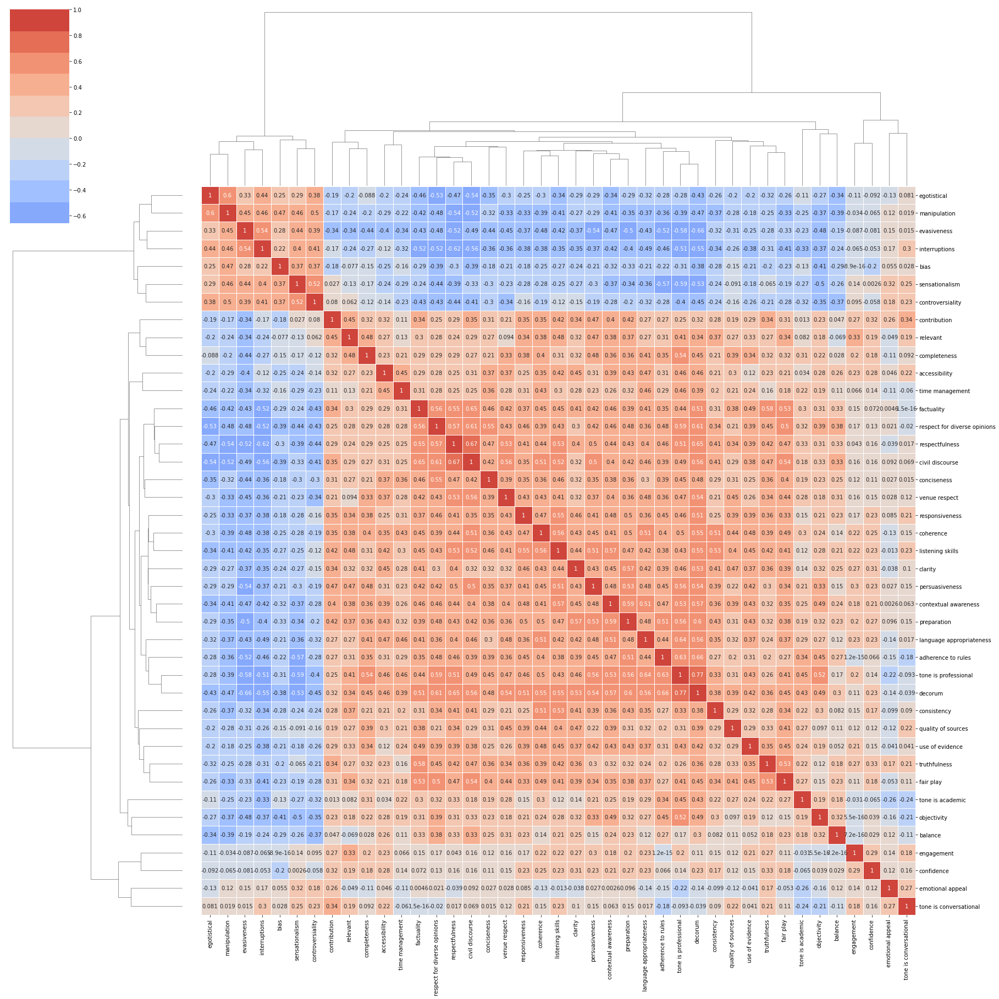

In [10]:
# plot correlations between predictor observables to identify which form a cluster
corr_sub = corr.copy()
corr_sub = corr_sub.loc[corr_sub.index.isin(set([o.name for o in predictor_observables.values()]))]
corr_sub = corr_sub[corr_sub.columns.intersection(set([o.name for o in predictor_observables.values()]))]

# f, ax = plt.subplots(figsize=(45, 45))
cmap = sns.color_palette("coolwarm", 12)

# sns.heatmap(corr_sub, cmap=cmap, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

# drop na
corr_sub = corr_sub.dropna(axis=0, how='all')
corr_sub = corr_sub.dropna(axis=1, how='all')

# print(corr_sub)

g = sns.clustermap(corr_sub, xticklabels=True, yticklabels=True, cmap=cmap, center=0, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
g.fig.set_size_inches(30, 30)

# sns.heatmap(corr_sub, cmap=cmap, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

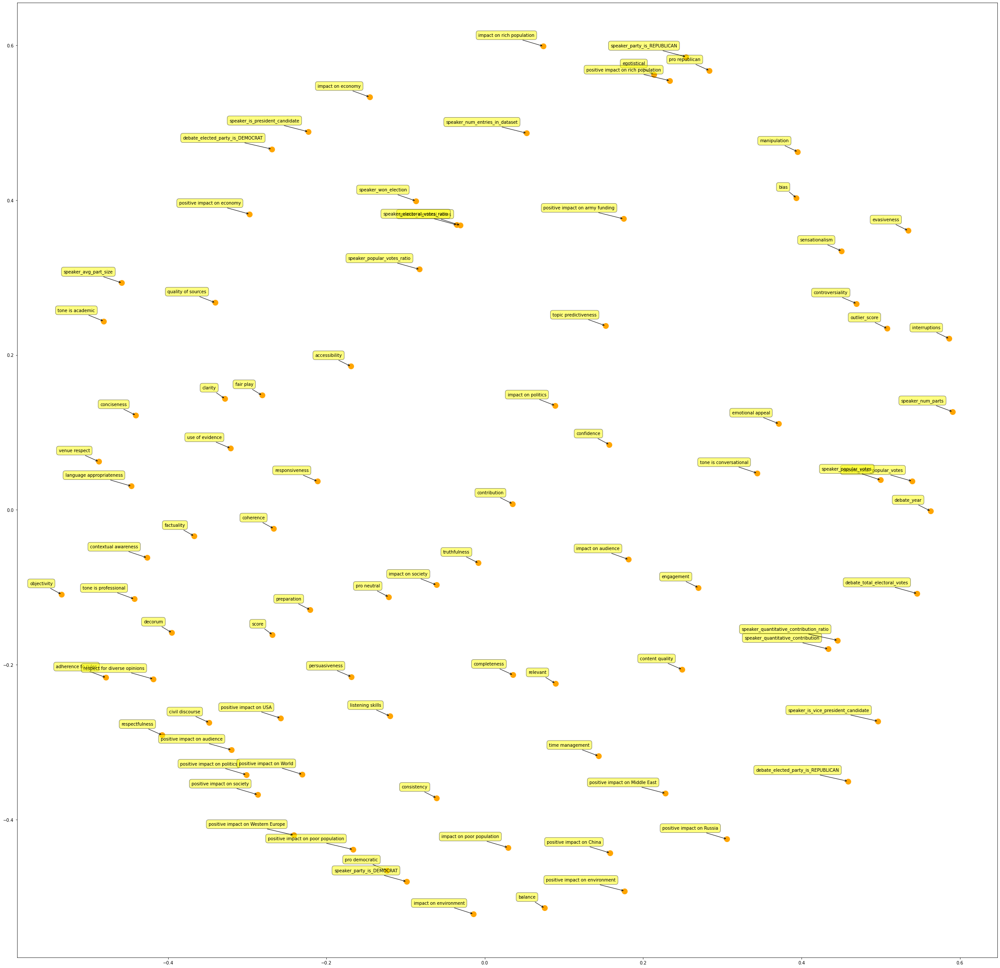

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import distance_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import MDS

# corr_graph = corr_sub.copy()
corr_graph = SS_SSO_grouped_candidates_only_df.copy().corr()

# remove rows and columns that are all na
corr_graph = corr_graph.dropna(axis=0, how='all')
corr_graph = corr_graph.dropna(axis=1, how='all')

dist_matrix = np.sqrt((1 - corr_graph) / 2)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=1)
coords = mds.fit_transform(dist_matrix)

plt.figure(figsize=(40, 40))
plt.scatter(coords[:, 0], coords[:, 1], color='orange', s=150)

for label, x, y in zip(dist_matrix.columns, coords[:, 0], coords[:, 1]):
    plt.annotate(label, xy=(x, y), xytext=(-20, 20), textcoords='offset points', ha='right', va='bottom',
                 bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
                 arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

plt.show()

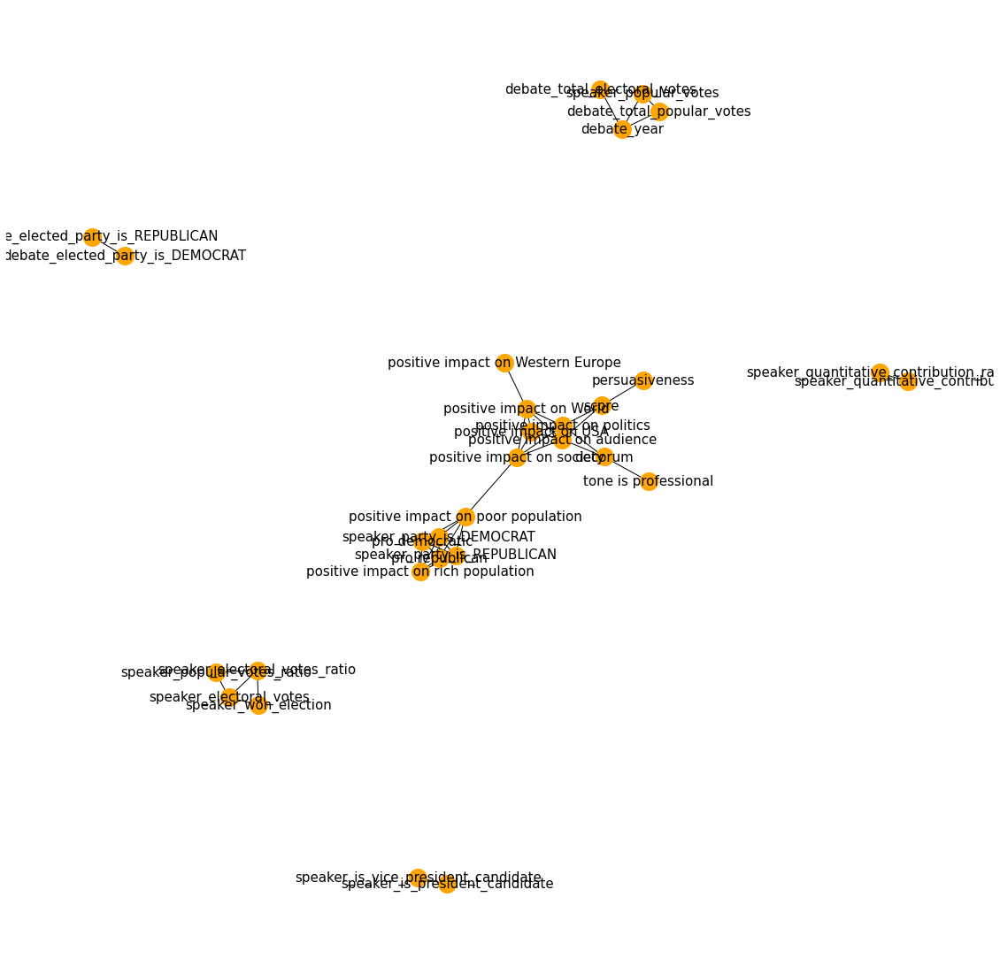

In [12]:
# libraries
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

df = SS_SSO_grouped_candidates_only_df.copy()

# Calculate the correlation between individuals. We have to transpose first, because the corr function calculate the pairwise correlations between columns.
corr = df.corr()

# Transform it in a links data frame (3 columns only):
links = corr.stack().reset_index()
links.columns = ['var1', 'var2', 'value']

# # Keep only correlation over a threshold and remove self correlation (cor(A,A)=1)
links_filtered=links.loc[ (abs(links['value']) > 0.7) & (links['var1'] != links['var2']) ]

# Build your graph
G=nx.from_pandas_edgelist(links_filtered, 'var1', 'var2')

# Plot the network:
f, ax = plt.subplots(figsize=(20, 20))
nx.draw(G, ax=ax, with_labels=True, node_color='orange', node_size=400, edge_color='black', linewidths=1, font_size=15)

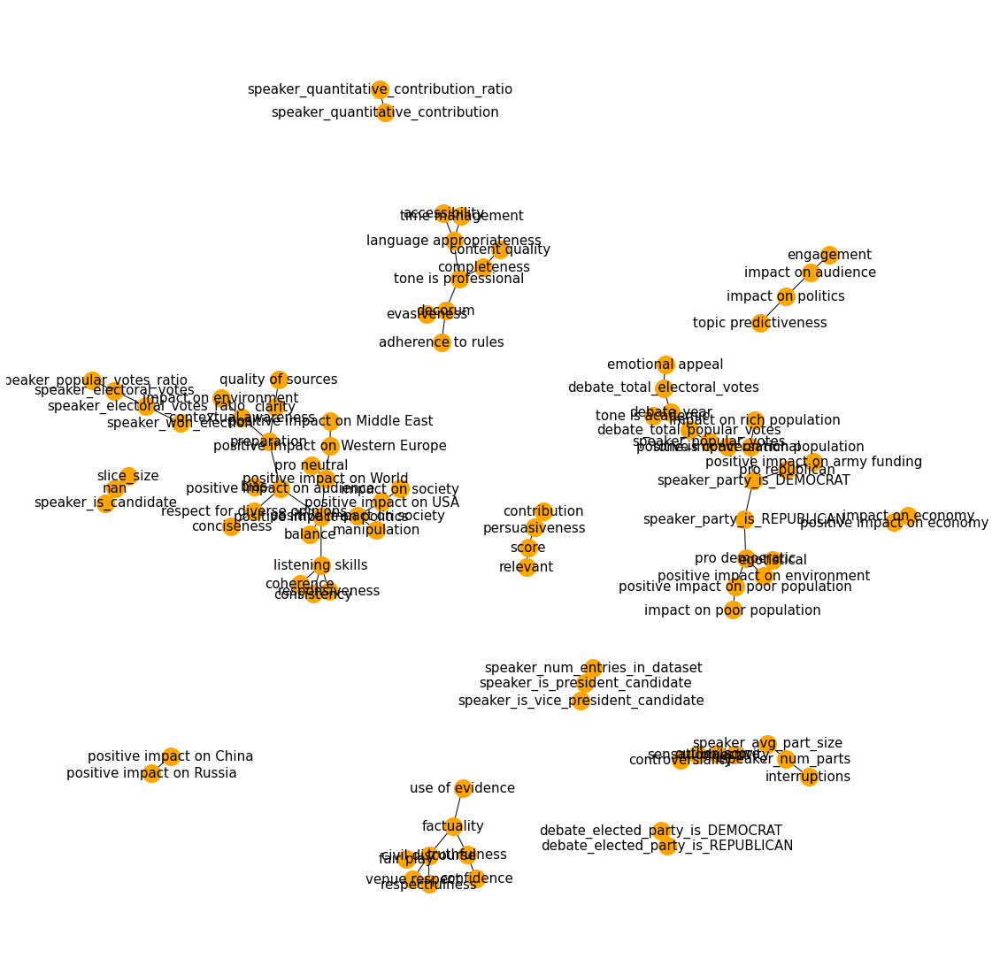

In [13]:
# libraries
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

df = SS_SSO_grouped_candidates_only_df.copy()
df.dropna(axis=0, how='all', inplace=True)
df.dropna(axis=1, how='all', inplace=True)

# Calculate the correlation between individuals. We have to transpose first, because the corr function calculate the pairwise correlations between columns.
corr = df.corr()

# for each row get column with max abs value
max_abs_corr_dict = {}
for key, data in corr.iterrows():
    max_abs_corr_dict[key] = data[data.index != key].abs().idxmax()

# # Build your graph
G = nx.Graph()
for key, value in max_abs_corr_dict.items():
    G.add_edge(key, value)

# # Plot the network:
f, ax = plt.subplots(figsize=(20, 20))
nx.draw(G, ax=ax, with_labels=True, node_color='orange', node_size=400, edge_color='black', linewidths=1, font_size=15)

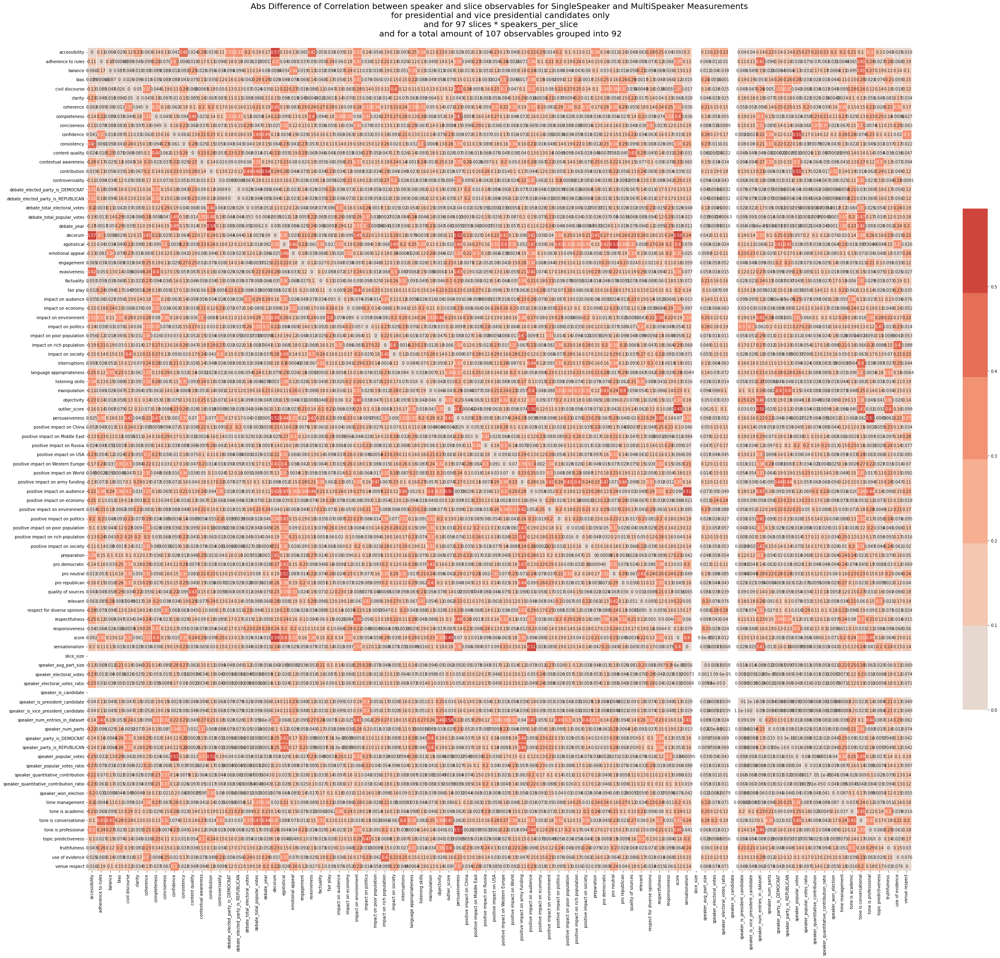

In [14]:
debates_d, slices_d, paragraphs_d = load_dataset()

slice_speaker_base_observables = load_slice_and_measured_observables(slices_d)
speaker_measurements = load_speaker_measurements()

MS_SSO = speaker_measurements['WS_MS_SSO_measurements']

MS_SSO_grouped_df, n_raw_observables, n_grouped_observables = prepare_speaker_observables(slice_speaker_base_observables, MS_SSO)

MS_SSO_grouped_candidates_only_df = MS_SSO_grouped_df[MS_SSO_grouped_df['speaker_party_is_UNKNOWN'] == 0]
MS_SSO_grouped_candidates_only_df = MS_SSO_grouped_candidates_only_df.drop(columns=['speaker_party_is_UNKNOWN'])

# heatmap of correlations
corr = MS_SSO_grouped_candidates_only_df.corr()
corr = corr.sort_values(by=['score'], ascending=False)
corr = corr.sort_values(by=['score'], axis=1, ascending=False)
# mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(45, 45))
# create color map between -1 and 1 for heatmap that is dark blue for -1, light blue for -0.5, white for 0, light red for 0.5, dark red for 1
# create color map where the gradient changes faster if there are more values in a bin
cmap = sns.color_palette("coolwarm", 12)

MS_SSO_corr = corr
# abs of difference between SS_SSO_corr and MS_SSO_corr
data = np.abs(SS_SSO_corr-MS_SSO_corr)
sns.heatmap(data, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
# sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.title(f'Abs Difference of Correlation between speaker and slice observables for SingleSpeaker and MultiSpeaker Measurements\n \
for presidential and vice presidential candidates only\n \
and for {len(MS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
plt.show()

['BROKAW', 'DANFORTH QUAYLE', 'LLOYD BENTSEN', 'WOODRUFF']


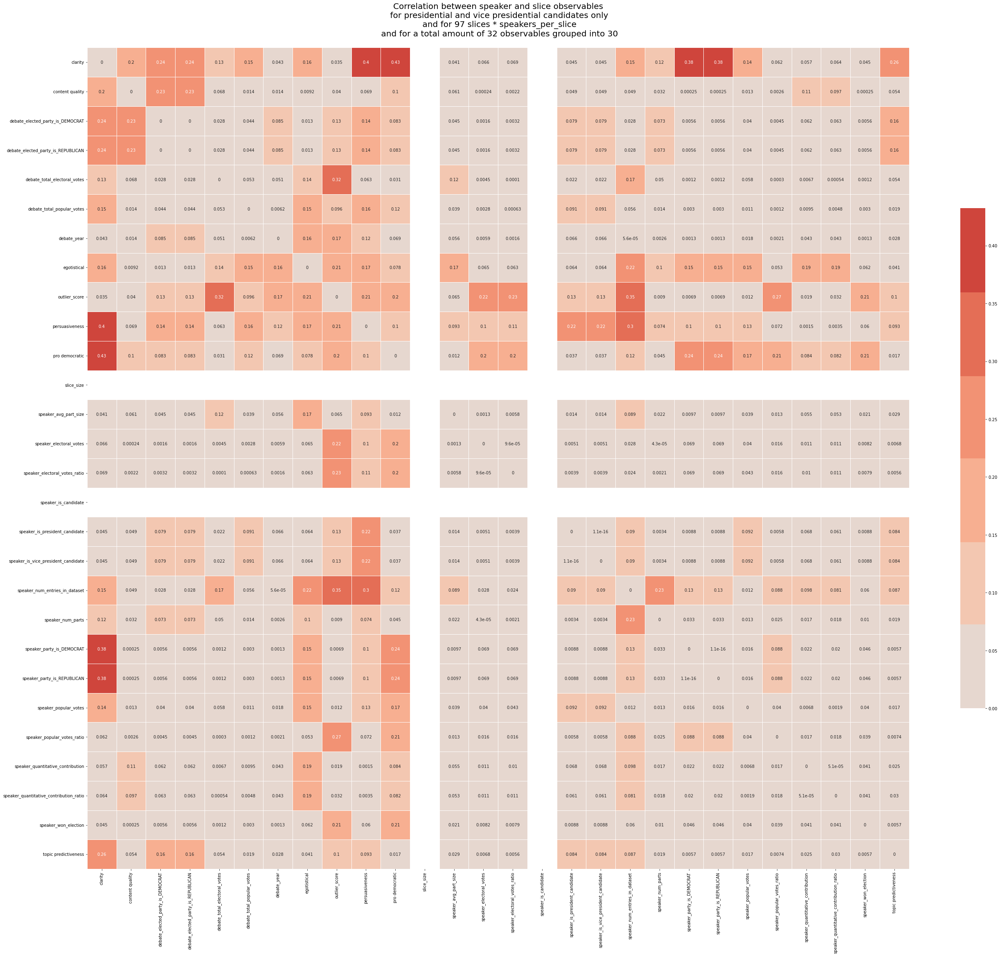

In [15]:
debates_d, slices_d, paragraphs_d = load_dataset()

slice_speaker_base_observables = load_slice_and_measured_observables(slices_d)
speaker_measurements = load_speaker_measurements()

df = speaker_measurements['WS_SS_MSO_group 1_measurements']
measured_observables = list(list(list(speaker_measurements.values())[0].values())[0].keys())
print(measured_observables)

df, n_raw_observables, n_grouped_observables = prepare_speaker_observables(slice_speaker_base_observables, df)

df = df[df['speaker_party_is_UNKNOWN'] == 0]
df = df.drop(columns=['speaker_party_is_UNKNOWN'])

# heatmap of correlations
corr = df.corr()
# corr = corr.sort_values(by=['score'], ascending=False)
# corr = corr.sort_values(by=['score'], axis=1, ascending=False)
# mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(45, 45))
# create color map between -1 and 1 for heatmap that is dark blue for -1, light blue for -0.5, white for 0, light red for 0.5, dark red for 1
# create color map where the gradient changes faster if there are more values in a bin
cmap = sns.color_palette("coolwarm", 12)

SS_MSO_corr = corr
# drop all in SS_SSO_corr that are not in SS_MSO_corr
SS_SSO_corr_dropped = SS_SSO_corr[SS_SSO_corr.index.isin(SS_MSO_corr.index)]
SS_SSO_corr_dropped = SS_SSO_corr_dropped[SS_SSO_corr_dropped.columns.intersection(SS_MSO_corr.columns)]
# abs of difference between SS_SSO_corr and MS_SSO_corr
data = np.abs(SS_SSO_corr_dropped-SS_MSO_corr)
sns.heatmap(data, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
# sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.title(f'Correlation between speaker and slice observables\n \
for presidential and vice presidential candidates only\n \
and for {len(MS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
plt.show()

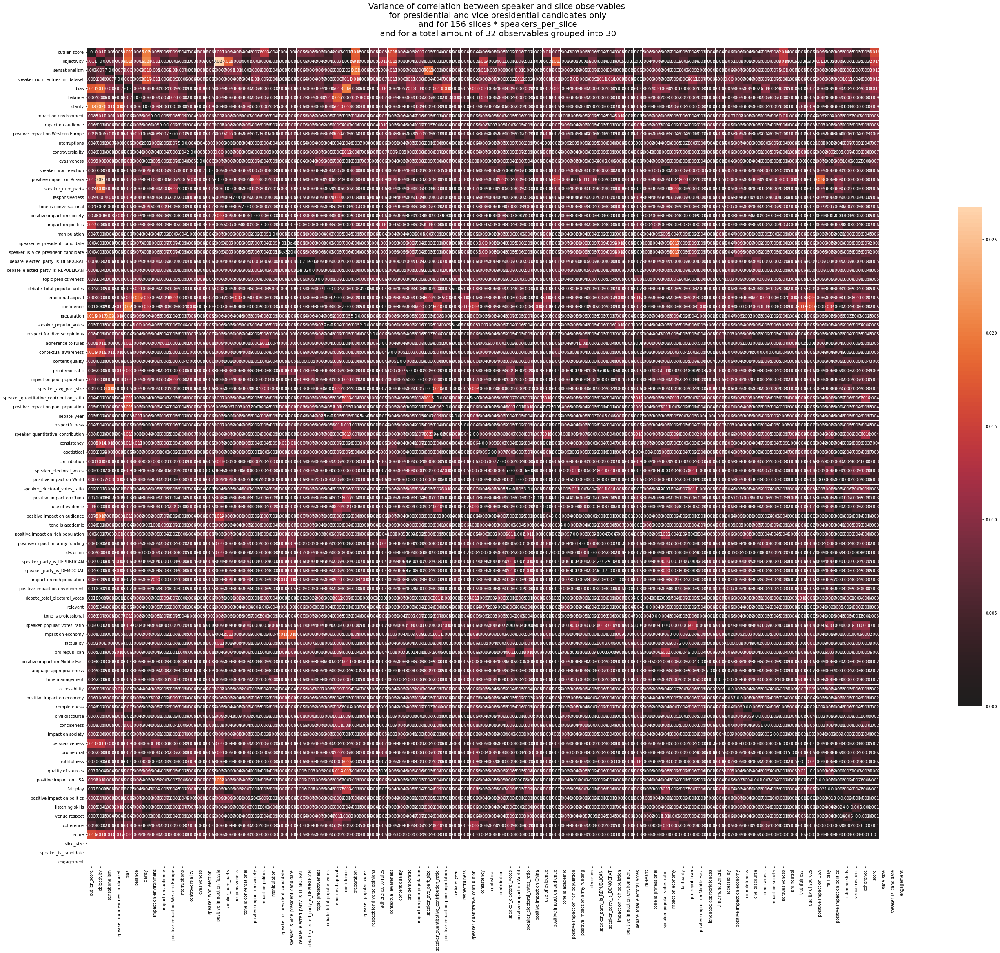

In [16]:
def kfold_cross_validation(df, accumulation_func, combine_func, n_splits=2, iterations=50):
    _vals = []
    for i in range(iterations):
        kf = KFold(n_splits, shuffle=True, random_state=i)
        
        for train_index, _ in kf.split(df):
            train_data = df.iloc[train_index]
            _vals.append(accumulation_func(train_data))
    
    columns = _vals[0].columns
    rows = _vals[0].index

    vals = np.array(_vals)
    acc_vals = np.zeros_like(vals[0])
    for i, j in itertools.product(range(vals.shape[1]), range(vals.shape[2])):
        acc_vals[i, j] = combine_func(vals[:, i, j])

    acc_vals = pd.DataFrame(acc_vals, index=rows, columns=columns)

    return acc_vals

# kfold cross validation over correlation of subsets
df = SS_SSO_grouped_candidates_only_df

# _correlations = []
# for i in range(50):
#     kf = KFold(2, shuffle=True, random_state=i)
    
#     for train_index, _ in kf.split(df):
#         train_data = df.iloc[train_index]
#         corr = train_data.corr()
#         _correlations.append(corr)

# # get variance of correlations
# columns = _correlations[0].columns
# correlations = np.array(_correlations)

# corr = correlations.var(axis=0)
# corr = pd.DataFrame(corr, index=columns, columns=columns)

corr = kfold_cross_validation(df, lambda x: x.corr(), lambda x: x.var())

corr = corr.sort_values(by=['score'], ascending=False)
corr = corr.sort_values(by=['score'], axis=1, ascending=False)
f, ax = plt.subplots(figsize=(45, 45))
sns.heatmap(corr, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
plt.title(f'Variance of correlation between speaker and slice observables\n \
for presidential and vice presidential candidates only\n \
and for {len(SS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
# plt.show()
plt.savefig(f'{plots_folder}/variance_of_correlation_between_speaker_and_slice_observables.png', dpi=300)




# # # plot catplot of correlations of score vs other observables
# # entries = []
# # # sort entries of corr by variance
# # corr_entries_sorted = corr.stack().sort_values(ascending=False)
# # # make sure that the same correlation is not added twice
# # seen = set()
# # for key_one, key_two in corr_entries_sorted.index:
# #     if (key_one, key_two) in seen or (key_two, key_one) in seen:
# #         continue
# #     seen.add((key_one, key_two))
# #     if key_one == key_two:
# #         continue
# #     for i in range(len(_correlations)):
# #         entries.append({'observable': f'{key_one} vs. {key_two}', 'correlation': _correlations[i][key_one][key_two]})
# # df = pd.DataFrame(entries)

# df = pd.DataFrame(corr.stack(), columns=['correlation'])
# # combine multiindex into one column

# df = df[df.index.map(lambda x: x[0]<=x[1])]
# df['observable'] = df.index.map(lambda x: f'{x[0]} vs. {x[1]}')
# observables = df.groupby('observable')['correlation'].var().sort_values(ascending=False).index
# # plot in groups of 30
# for i in range(0, len(df.groupby('observable')), 30):
#     # get next 30 observables
#     data = df[df['observable'].isin(observables[i:i+30])]
#     g = sns.catplot(x="observable", y="correlation", kind="violin", data=data, height=10, aspect=2)
#     g.fig.set_size_inches(30, 10)
#     g.set_xticklabels(rotation=90)
#     # plt.show()
#     plt.savefig(f'{plots_folder}/correlation_variances_wide_violin_{i}.png', bbox_inches='tight', dpi=300)
#     if i!=0:
#         plt.close()

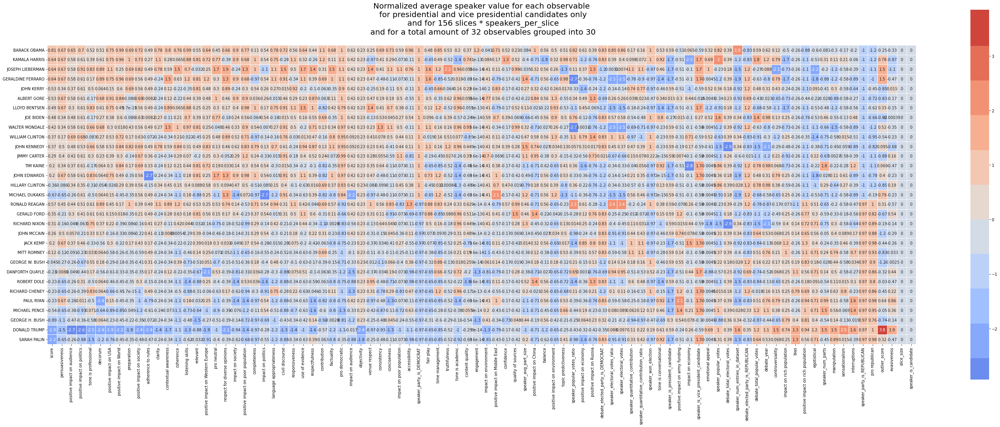

In [17]:
# speaker vs average slice observables heatmap
df = SS_SSO_grouped_candidates_only_df.copy()

values = {}
for key in df.keys():
    if isinstance(df[key].iloc(0)[0], str):
        continue
    values[key] = {}
    for speaker in df['speaker'].unique():
        values[key][speaker] = df[df['speaker'] == speaker][key].mean()
        # normalize
        values[key][speaker] = values[key][speaker] - df[key].mean()
        key_std = df[key].std()
        if key_std != 0:
            values[key][speaker] = values[key][speaker] / key_std

# add a row with sum of abs called outlier_score
values['outlier_score'] = {}
for speaker in list(values.values())[0].keys():
    values['outlier_score'][speaker] = sum([values[key][speaker]**2 for key in values.keys() if key != 'outlier_score'])
# normalize outlier_score
outlier_score_mean = np.mean(list(values['outlier_score'].values()))
outlier_score_std = np.std(list(values['outlier_score'].values()))
for speaker in list(values.values())[0].keys():
    values['outlier_score'][speaker] = (values['outlier_score'][speaker] - outlier_score_mean) / outlier_score_std


speakers = df['speaker'].unique()
observables = list(values.keys())

# # sort speakers by their score in pro republican
# speakers = sorted(speakers, key=lambda speaker: values['pro republican'][speaker], reverse=True)
# speakers = sorted(speakers, key=lambda speaker: values['speaker_party_is_REPUBLICAN'][speaker], reverse=True)
speakers = sorted(speakers, key=lambda speaker: values['score'][speaker] - 10 * values['speaker_party_is_REPUBLICAN'][speaker], reverse=True)
# # sort observables by normalized dot product of their values with pro republican
# observables = sorted(observables, key=lambda observable: np.dot([values[observable][speaker] for speaker in speakers], [values['pro republican'][speaker] for speaker in speakers]), reverse=True)
# speakers = sorted(speakers, key=lambda speaker: values['score'][speaker], reverse=True)
# # sort by correlation with score, but with all 0 values at the end
# observables = sorted(observables, key=lambda observable: -4 + int(observable not in corr['score']) if sum(map(abs,values[observable].values())) <= 0.2 or observable not in corr['score'] else  corr['score'][observable] , reverse=True)
# observables = sorted(observables, key=lambda observable: -10 + int(observable not in corr['score']) if sum(map(abs,df[observable].std())) <= 1e-8 or observable not in corr['score'] else  corr['score'][observable] , reverse=True)

# or if NAN
corr = df.corr()
observables = sorted(observables, key=lambda observable: (-10 + int(observable not in corr['score'])) if df[observable].std() <= 1e-8 or observable not in corr['score'] or corr['score'][observable]!=corr['score'][observable] else  corr['score'][observable] , reverse=True)
# observables = sorted(observables, key=lambda observable: corr['score'][observable] if observable in corr['score'].keys() and corr['score'][observable]==corr['score'][observable] else -10, reverse=True)
speaker_observable_value_matrix = []
for speaker in speakers:
    speaker_observable_value_matrix.append([values[observable][speaker] for observable in observables])

f, ax = plt.subplots(figsize=(50, 35))
cmap = sns.color_palette("coolwarm", 12)
sns.heatmap(speaker_observable_value_matrix, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
# set xticks to speaker names
ax.set_yticklabels(speakers, rotation=0)
ax.set_xticklabels(observables, rotation=90)
plt.title(f'Normalized average speaker value for each observable\n \
for presidential and vice presidential candidates only\n \
and for {len(SS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
plt.show()




# # values = {k: v for k, v in sorted(values.items(), key=lambda item: sum(map(abs, item[1].values())), reverse=True)}
# values_df_entries = []
# for key, value in values.items():
#     for speaker, v in value.items():
#         values_df_entries.append({'speaker': speaker, 'observable': key, 'value': v})
# values_df = pd.DataFrame(values_df_entries)

# print(values_df.head())

# # sort speakers by value in pro_republican direction
# # values_df = values_df.sort_values(by=['value'], ascending=False)

# # sort by sum of absolute values
# # values_df = values_df.sort_values(by=['speaker'], ascending=True)
# # values_df = values_df.sort_values(by=['value'], ascending=False)
# # values_df = values_df.sort_values(by=['value'], axis=1, ascending=False)

# print(values)

# f, ax = plt.subplots(figsize=(25, 25))
# sns.heatmap(values_df.pivot("speaker", "observable", "value"), cmap=cmap, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
# plt.title(f'Average slice observables for presidential and vice presidential candidates only\n \
# and for {len(SS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
# and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
# plt.show()

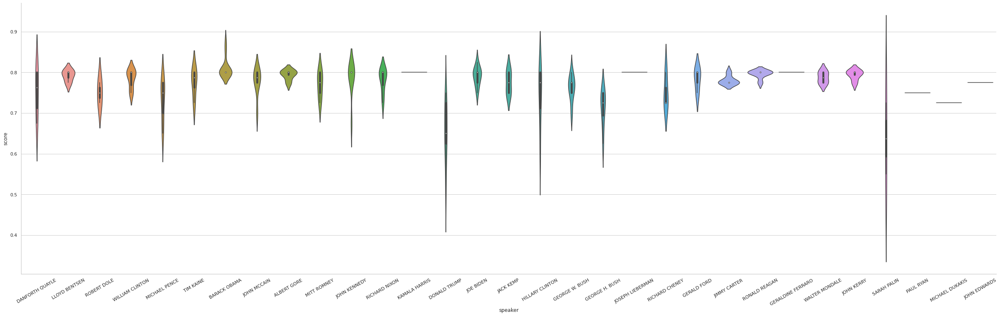

In [18]:
# violin plots of each speakers vs score
df = SS_SSO_grouped_candidates_only_df.copy()

sns.set(style="whitegrid")
fig = sns.catplot(x="speaker", y="score", kind="violin", data=df, height=10, aspect=2)
# fig = sns.catplot(x="speaker", y="speaker_num_entries_in_dataset", kind="violin", data=df, height=10, aspect=2)
fig.fig.set_size_inches(35, 10)
fig.set_xticklabels(rotation=30)

/home/david/anaconda3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:289: RuntimeWarning: invalid value encountered in true_divide
  correlation_coefficient /= X_norms
/home/david/anaconda3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:289: RuntimeWarning: invalid value encountered in true_divide
  correlation_coefficient /= X_norms
/home/david/anaconda3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:289: RuntimeWarning: invalid value encountered in true_divide
  correlation_coefficient /= X_norms
/home/david/anaconda3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:289: RuntimeWarning: invalid value encountered in true_divide
  correlation_coefficient /= X_norms
/home/david/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, 

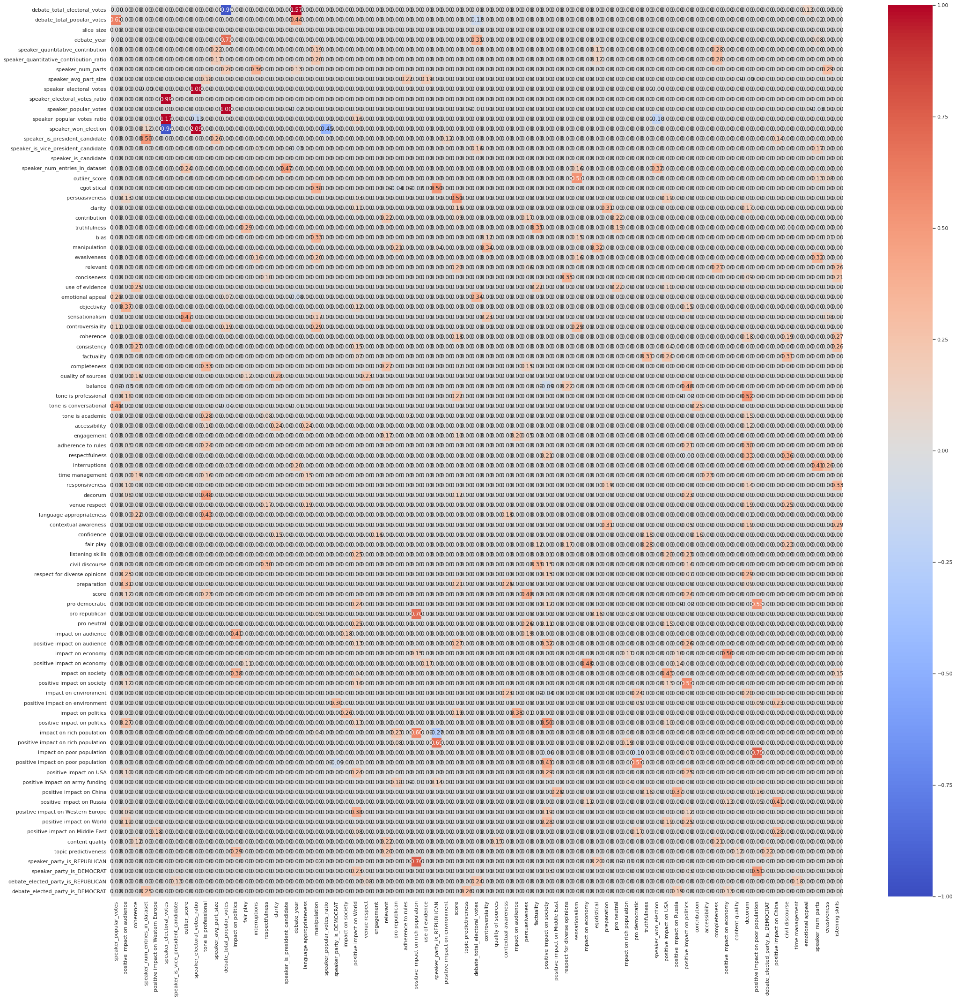

In [19]:
df = SS_SSO_grouped_candidates_only_df

# remove all strings from df
df = df[[v for v in df.keys() if not isinstance(df[v].iloc[0], str)]]

# create a heatmap of the activation functions with the left side being the input and the right side being the output
formulas = {}
for k in df.keys():
    # remove all others in a group when v is in group slice_speaker_observables_correlated_by_design
    blacklist = [k]
    for v in slice_speaker_observables_correlated_by_design:
        if k in v:
            blacklist.extend(v)
    blacklist = list(set(blacklist))
    
    # X = df[[v for v in df.keys() if v != k]]
    X = df[[v for v in df.keys() if v not in blacklist]]
    y = df[k]
    # copy them
    X = X.copy()
    y = y.copy()
    # normalize
    for v in X.keys():
        if X[v].std() != 0:
            X[v] = (X[v] - X[v].mean()) / X[v].std()
        else:
            X[v] = X[v] - X[v].mean()

    if y.std() != 0:
        y = (y - y.mean()) / y.std()
    else:
        y = y - y.mean()

    m = LinearRegression()
    m.fit(X, y)

    m2 = Ridge(alpha=0.5)
    m2.fit(X, y)

    # regression that only keeps max 4 features
    m3 = ElasticNet(alpha=0.5, l1_ratio=0.5)
    m3.fit(X, y)

    X_slected = SelectKBest(r_regression, k=4).fit_transform(X, y)
    selected_features = SelectKBest(r_regression, k=4).fit(X, y).get_support()
    selected_features = [v for i, v in enumerate(X.keys()) if selected_features[i]]
    m4 = LinearRegression()
    m4.fit(X_slected, y)

    formulas[k] = {
        # 'LinearRegression R^2': m.score(X, y),
        # f'Ridge (alpha={m2.alpha}) R^2': m2.score(X, y),
        # f'ElasticNet (alpha={m3.alpha}, l1_ratio={m3.l1_ratio}) R^2': m3.score(X, y),
        # f'LinearRegression (only 4 features) R^2': m4.score(X_slected, y),
    }

    # add activations of m4 weights
    for i, coef in enumerate(m4.coef_):
        if abs(coef) > 1e-10:
            formulas[k][selected_features[i]] = coef

    # print(f'{k} vs all')
    # print(f'\tR^2: {m.score(X, y):.3f}')
    # features = []
    # for i, coef in enumerate(m.coef_):
    #     if abs(coef) > 1e-10:
    #         features.append((coef, X.keys()[i]))
    # features = sorted(features, key=lambda x: abs(x[0]), reverse=True)[:6]
    # print(' + '.join([f'{coef:.3f} * {feature}' for coef, feature in features]))
    # # print(f'\tcoef: {m.coef_}')
    # print(f'\tR^2: {m2.score(X, y):.3f}')
    # # print(f'\tcoef: {m2.coef_}')
    # print(f'\tR^2: {m3.score(X, y):.3f}')
    # # print the names of the non zero coefficients as a formula
    # print(f'\tR^2: {m4.score(X_slected, y):.3f}')
    # print('\tFromula:\t', end='')
    # features = []
    # for i, coef in enumerate(m4.coef_):
    #     if abs(coef) > 1e-10:
    #         features.append((coef, selected_features[i]))
    # features = sorted(features, key=lambda x: abs(x[0]), reverse=True)
    # print(' + '.join([f'{coef:.3f} * {feature}' for coef, feature in features]))
    # print()

# create a heatmap of the activation functions with the left side being the input and the right side being the output
columns = list(set([k for v in formulas.values() for k in v.keys()]))
rows = list(formulas.keys())

data = np.zeros((len(rows), len(columns)))
for i, row in enumerate(rows):
    for j, column in enumerate(columns):
        if column in formulas[row]:
            data[i, j] = formulas[row][column]
        else:
            data[i, j] = 0

f, ax = plt.subplots(figsize=(35, 35))
# coolwarm
cmap = sns.color_palette("coolwarm", as_cmap=True)
sns.heatmap(data, xticklabels=columns, yticklabels=rows, annot=True, fmt='.2f', cmap=cmap, ax=ax, vmin=-1, vmax=1)
# rotate the xticks
plt.xticks(rotation=90)
# xticks not showing up
plt.show()